In [1]:
%load_ext autoreload
%autoreload 2
import os
import pickle as pkl
from typing import Dict, Any
from collections import Counter

import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
import sklearn as sk
from tqdm import tqdm
from sklearn.metrics import (
    accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, 
    average_precision_score, precision_recall_curve, plot_precision_recall_curve, make_scorer
)
from sklearn.model_selection import KFold, cross_validate, train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 250
import dvu  # for visualization

import imodels

# change working directory to project root
if os.getcwd().split('/')[-1] == 'notebooks':
    os.chdir('../..')

from experiments.models.stablelinear import StableLinearClassifier
from experiments.models.stableskope import StableSkopeClassifier
from experiments.notebooks import viz
from experiments.util import (
    get_comparison_result, get_openml_dataset, get_clean_dataset, 
    get_best_model_under_complexity, MODEL_COMPARISON_PATH
)

np.random.seed(0)

/accounts/projects/binyu/keyan3/imodels/experiments/notebooks


In [55]:
# np.random.seed(0)
# x, y, feat_names = get_clean_dataset('experiments/data/haberman.csv')
# xtrain, xtest, ytrain, ytest = sk.model_selection.train_test_split(x, y, test_size=0.2, random_state=0)
# m = imodels.BayesianRuleListClassifier()
# m.fit(xtrain, ytrain)

# # print(m.rules_)

# ms = []
# for m in [imodels.SkopeRulesClassifier(n_estimators=90, max_depth=2, max_samples=0.8, max_samples_features=s) for s in [0.2, 0.4, 0.6, 0.8, 1.0]]:
# m = imodels.RuleFitClassifier(n_estimators=100, include_linear=False, alpha=30, max_rules=None) #max_depth=1)
# m = imodels.FPLassoClassifier(minsupport=0.1, disc_strategy='simple', 
#                               disc_kwargs={'strategy':'quantile', 'n_bins': 3}, 
#                               include_linear=False, alpha=1, max_rules=None)
# m = imodels.BayesianRuleListClassifier(minsupport=0.5, disc_strategy='simple', disc_kwargs={'strategy':'uniform'}, max_iter=1000)
# ms.append(m)
# m.fit(xtrain, ytrain, feature_names=feat_names)

In [56]:
# m.rules_

In [57]:
# print(roc_auc_score(ytest, m.predict_proba(xtest)[:, 1]))
# print(accuracy_score(ytest, m.predict(xtest)))

In [58]:
# from slurmpy import Slurm
# partition = 'high'
# s = Slurm("compare_models", {"partition": partition})

In [59]:
# for i in range(20, 26):
#     s.run(f'python experiments/compare_models.py --model brl --parallel_id {i} --cv --ignore_cache')
#     s.run(f'python experiments/compare_models.py --model brl --parallel_id {i} --ignore_cache')

In [60]:
# df = get_comparison_result(MODEL_COMPARISON_PATH, 'fpskope', 'cv')['df']
# df

In [121]:
# get_comparison_result(MODEL_COMPARISON_PATH, 'brl', 'val')['df']
# df = pkl.load(open('experiments/comparison_data/reg_data/easy/val/stbl_l2_comparisons.pkl', 'rb'))['df']


In [18]:
# get_comparison_result(MODEL_COMPARISON_PATH, 'brl', prefix='test')['df']

# validation plots - hard datasets

## single validation set

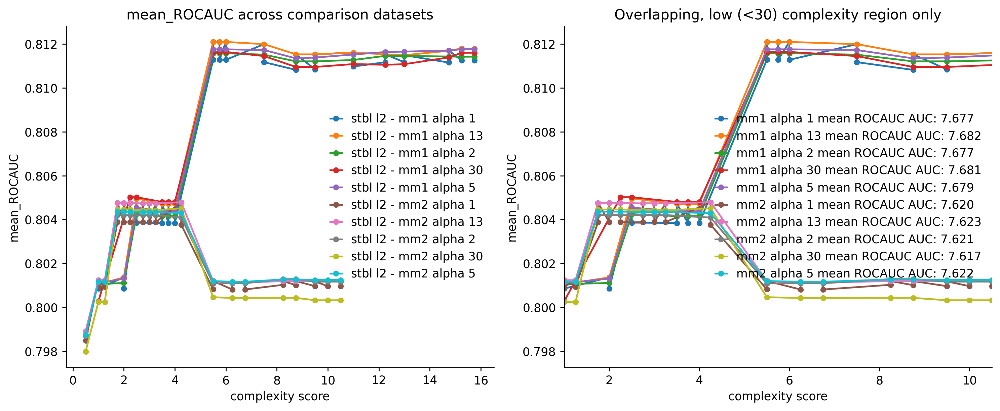

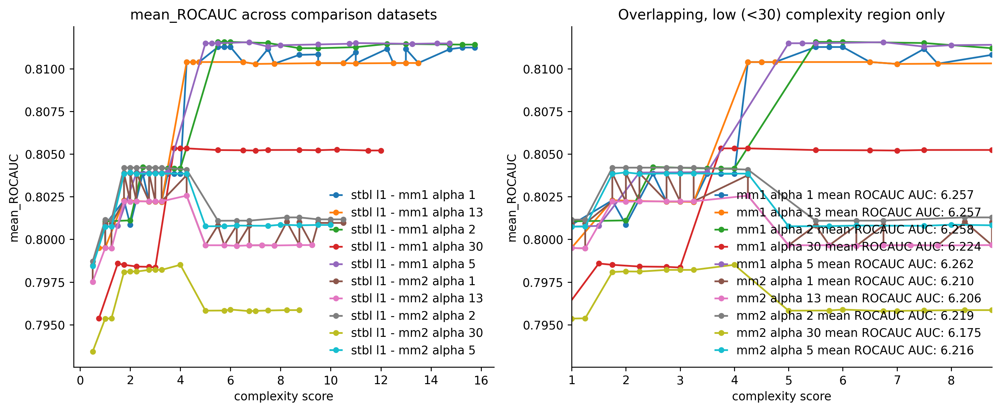

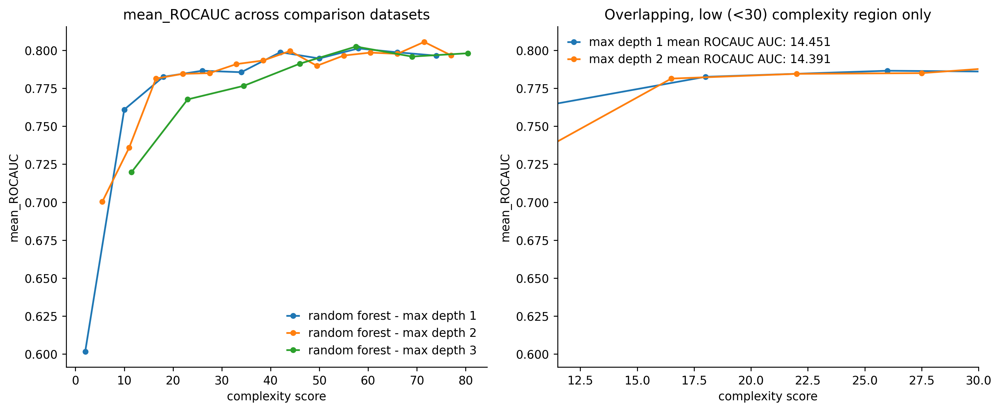

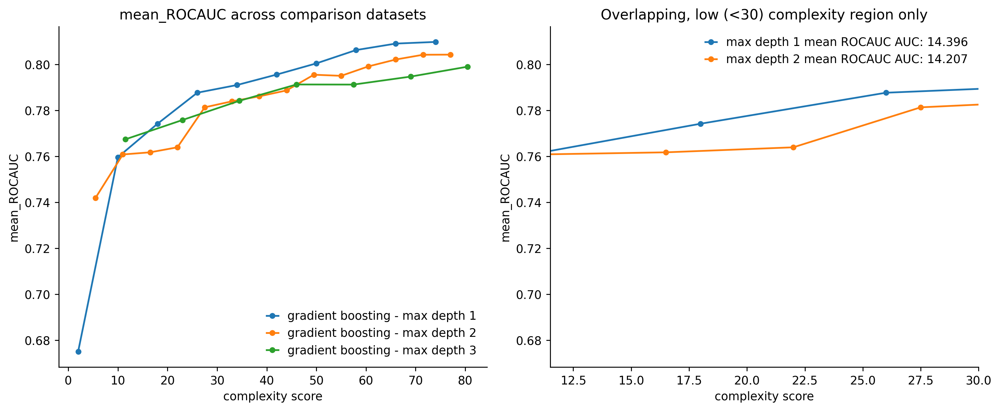

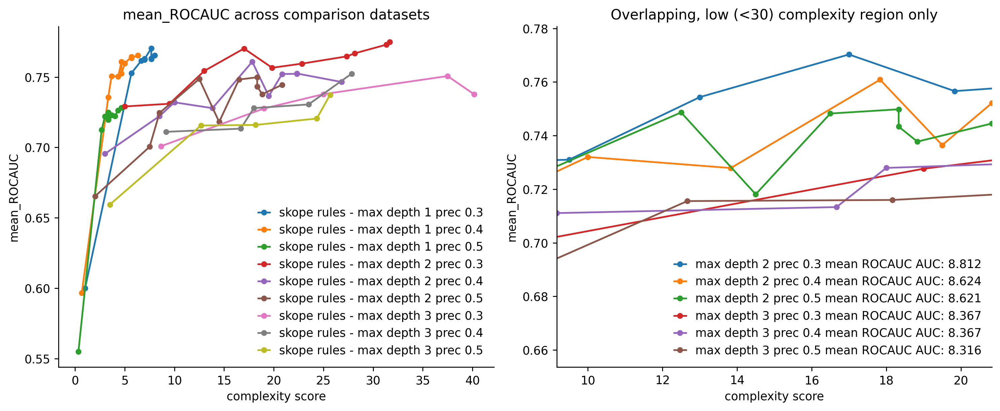

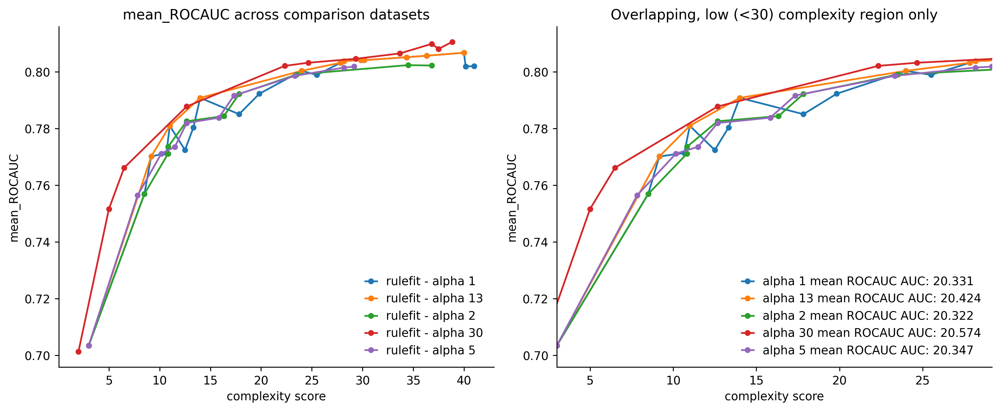

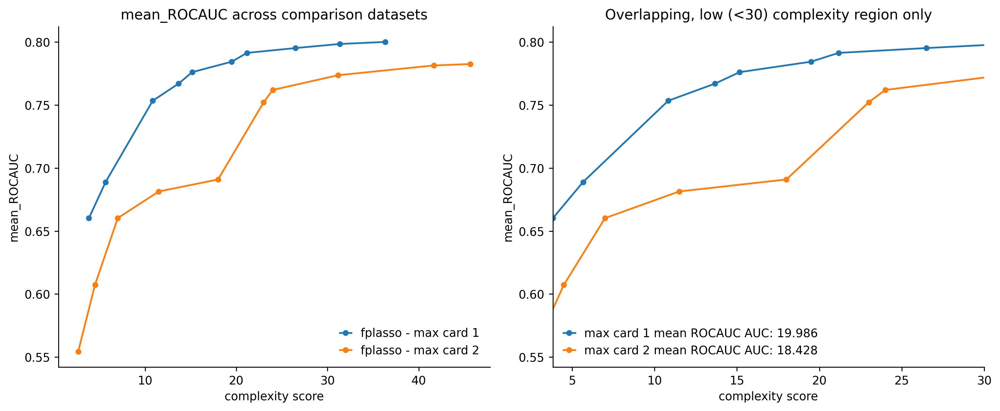

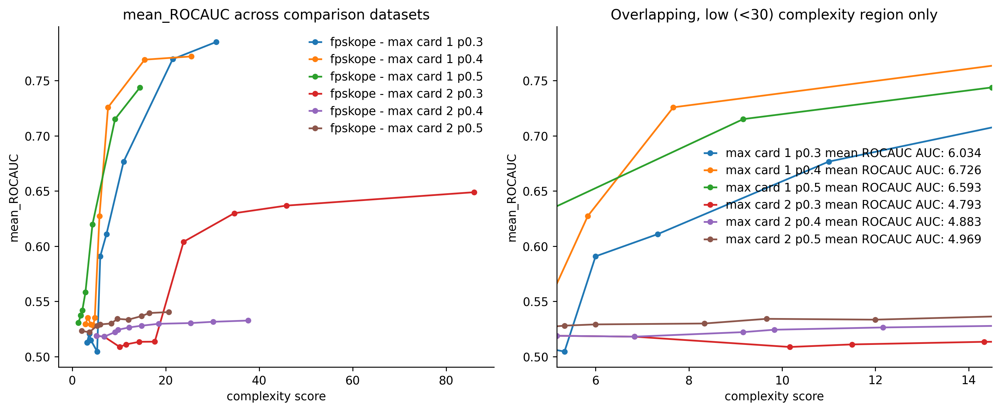

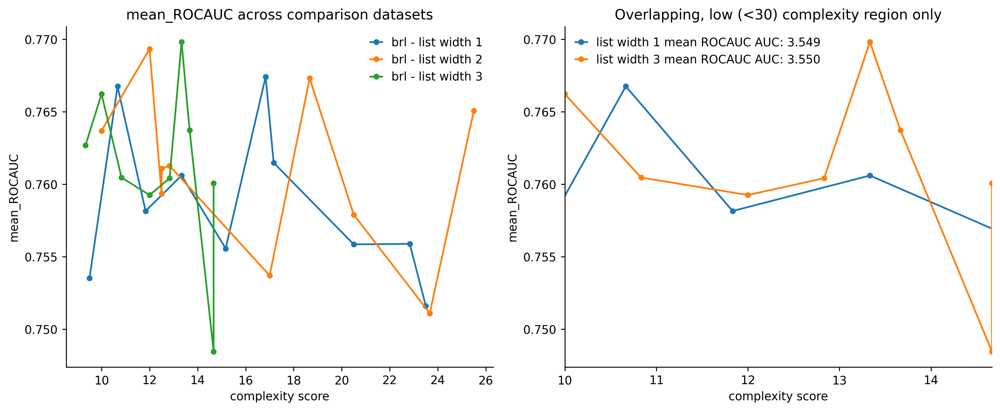

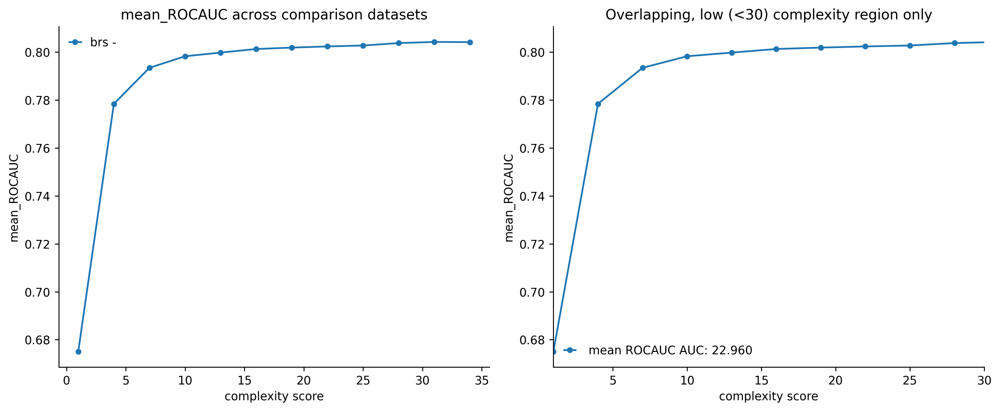

In [6]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname) for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

## cross validation

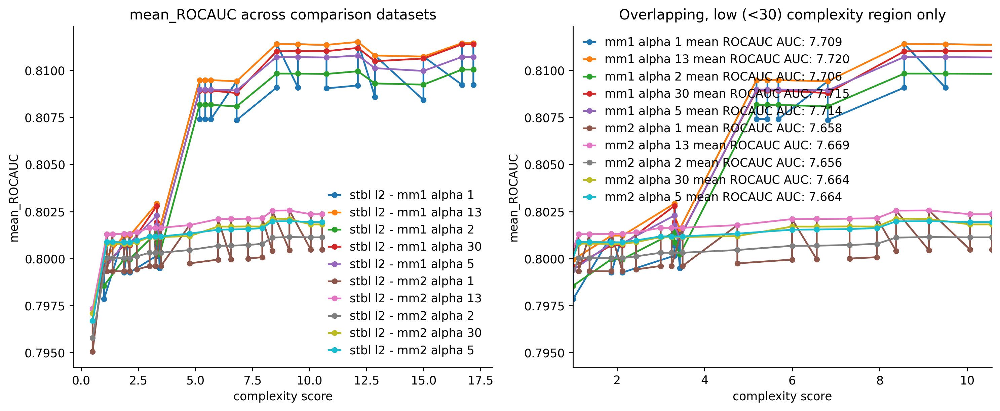

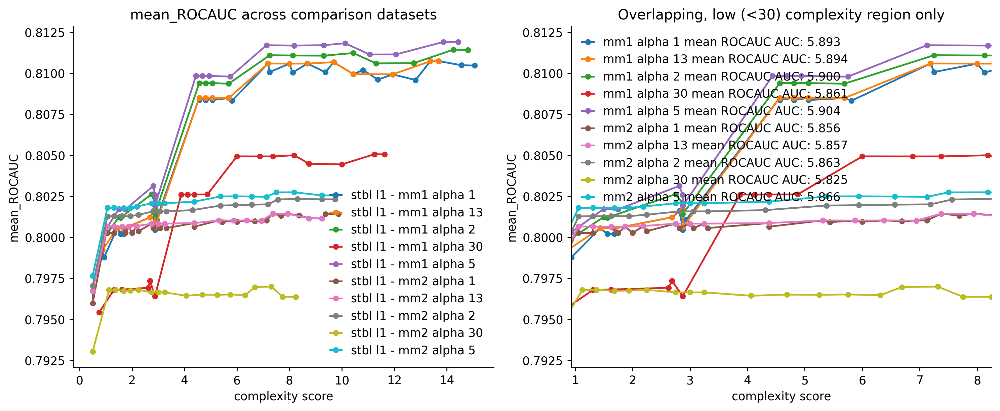

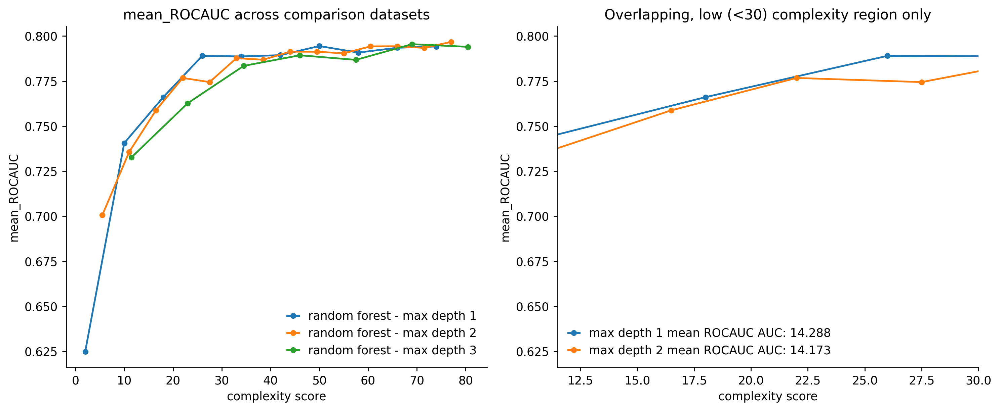

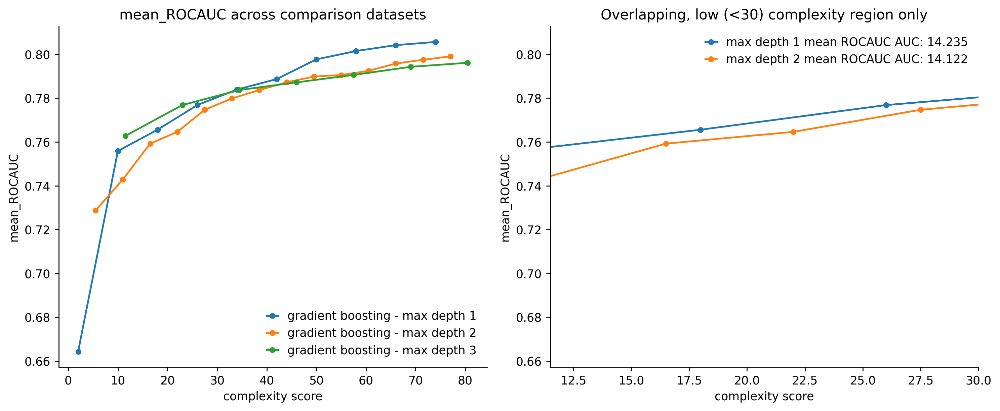

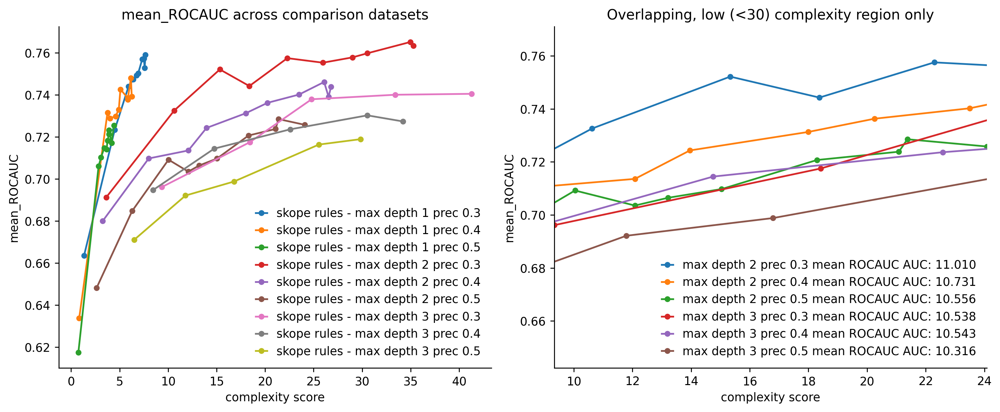

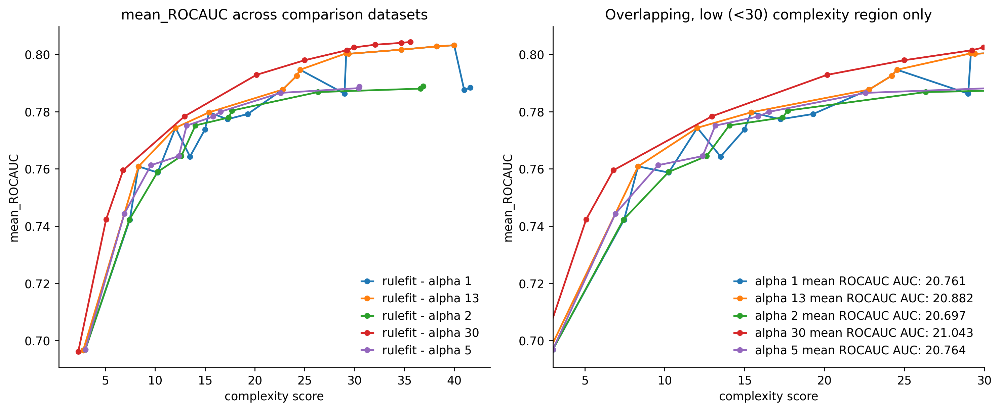

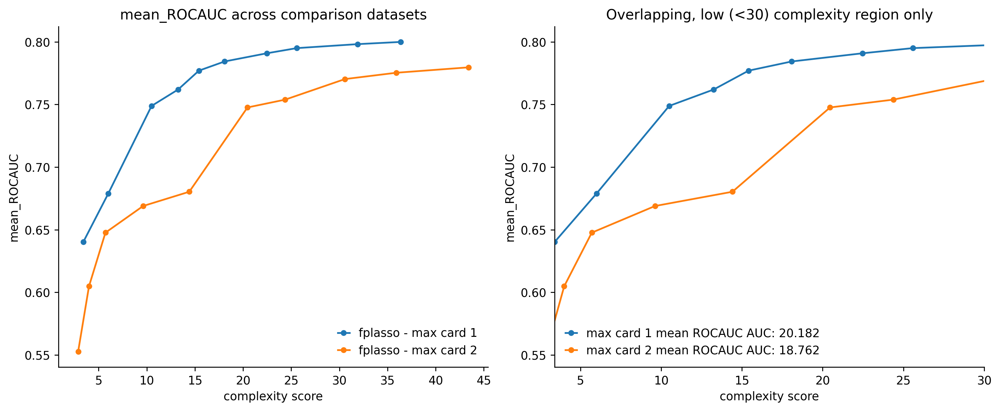

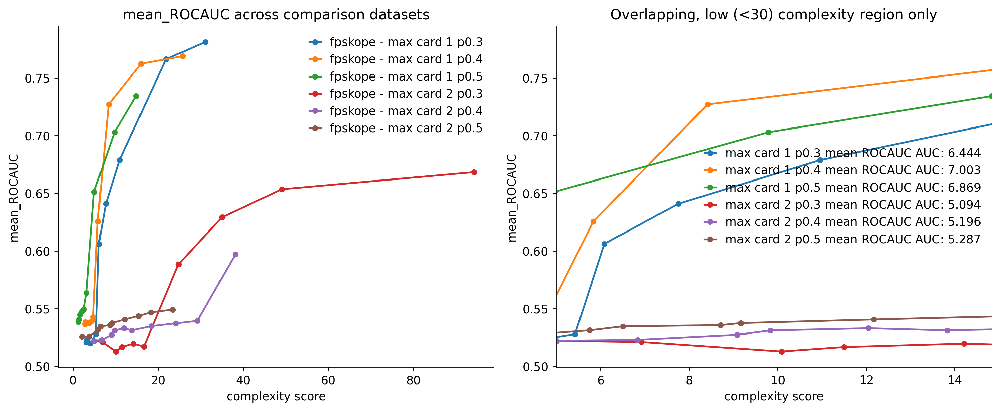

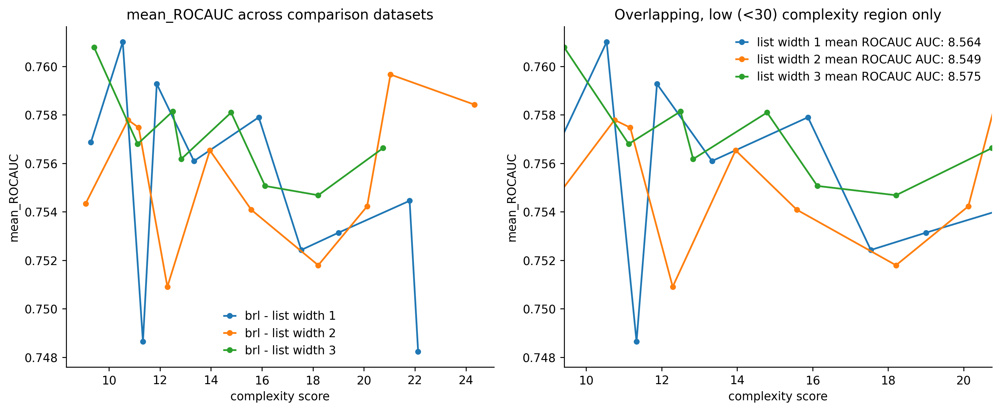

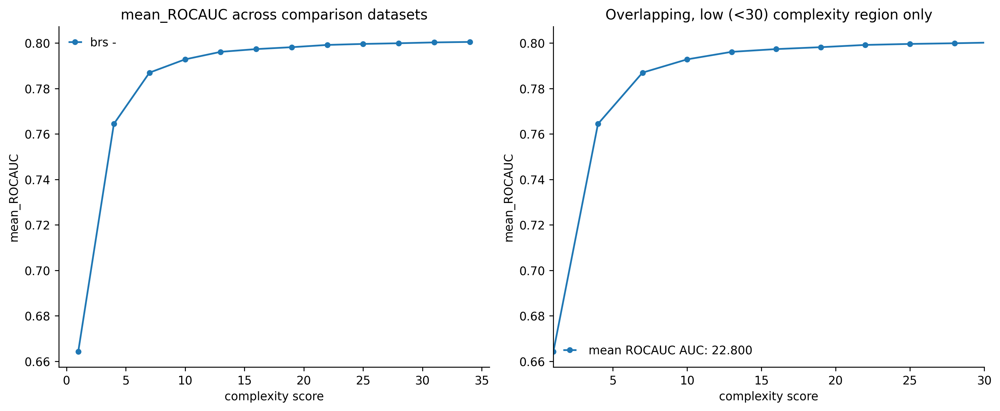

In [33]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, prefix='cv') for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

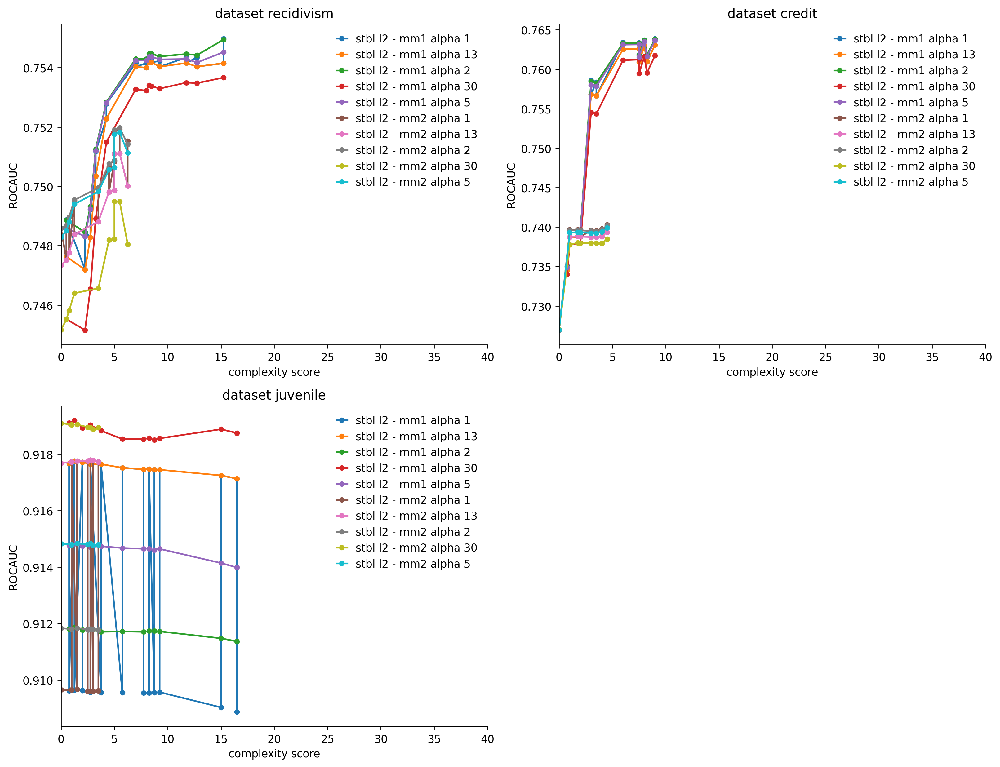

In [35]:
viz.viz_comparison_datasets(val_results[0], 'ROCAUC', cols=2, figsize=(13, 10), datasets=['recidivism', 'credit', 'juvenile'], test=False)
plt.show()

In [31]:
np.arange(1, 137, 15)

array([  1,  16,  31,  46,  61,  76,  91, 106, 121, 136])

# validation plots - easy datasets

## single validation set

In [120]:
# get_comparison_result(MODEL_COMPARISON_PATH, 'stbl_l2', easy=True)['df']

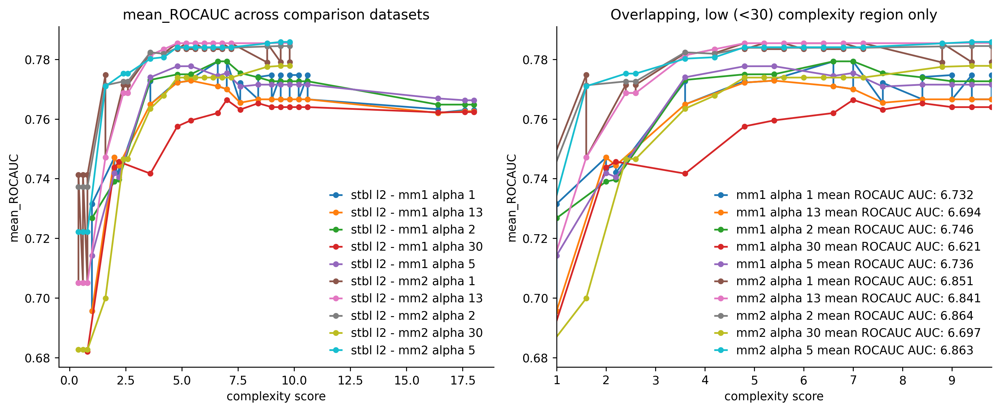

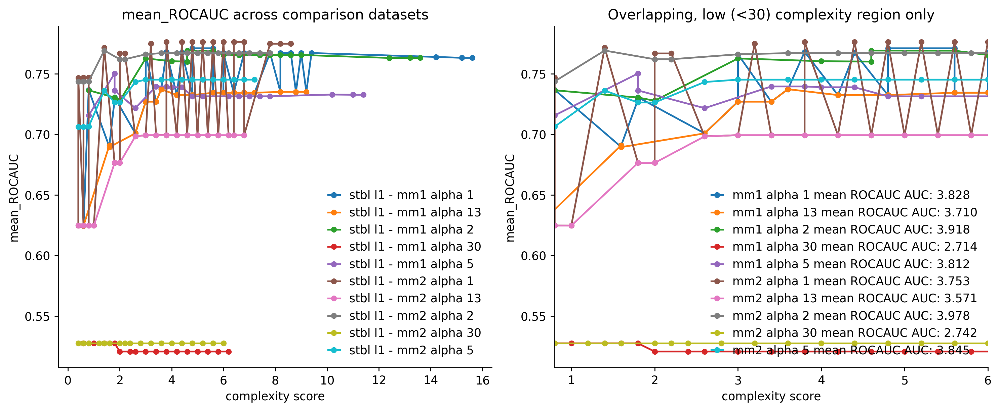

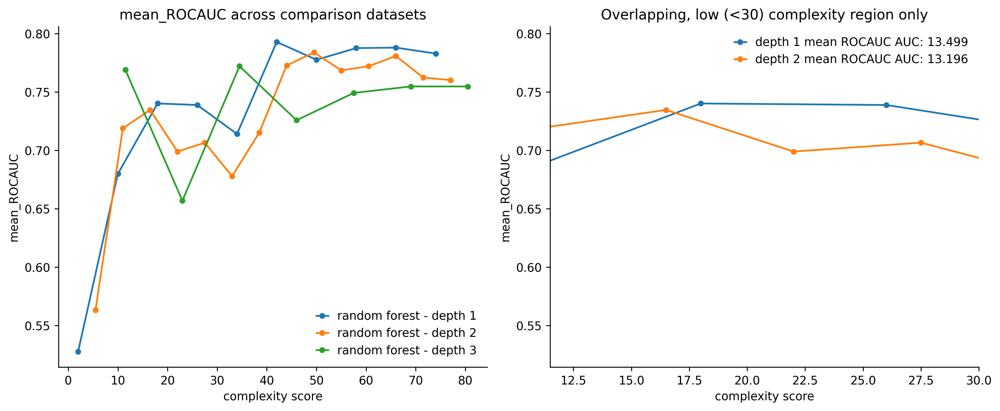

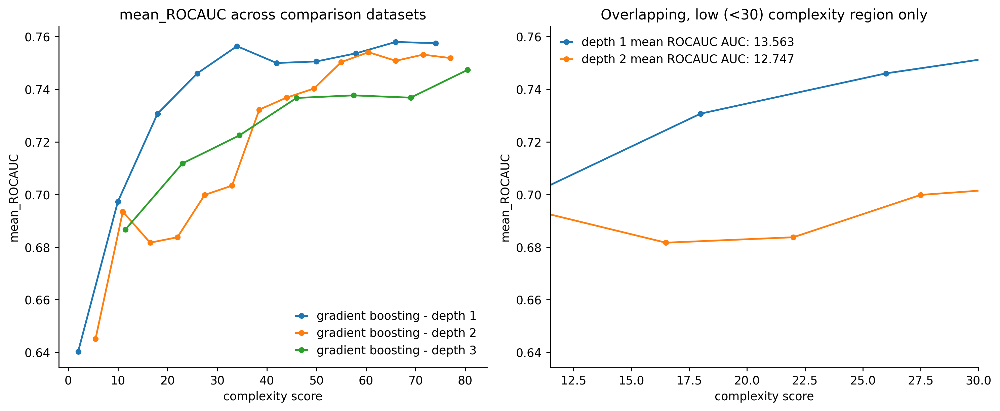

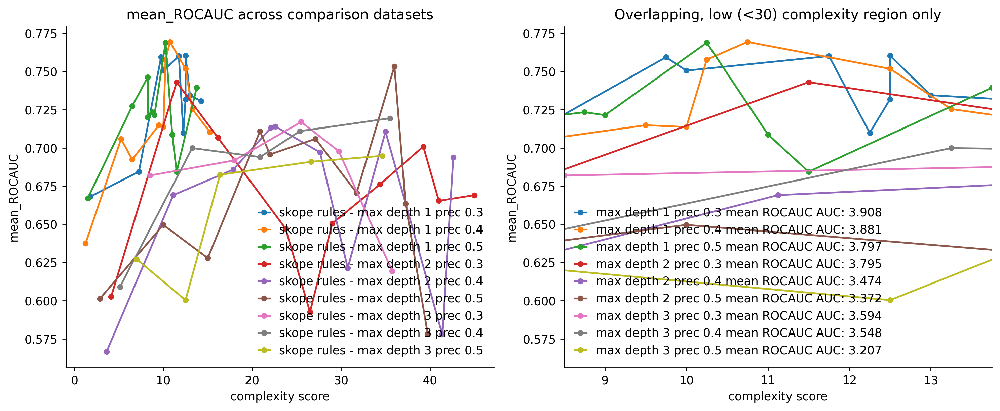

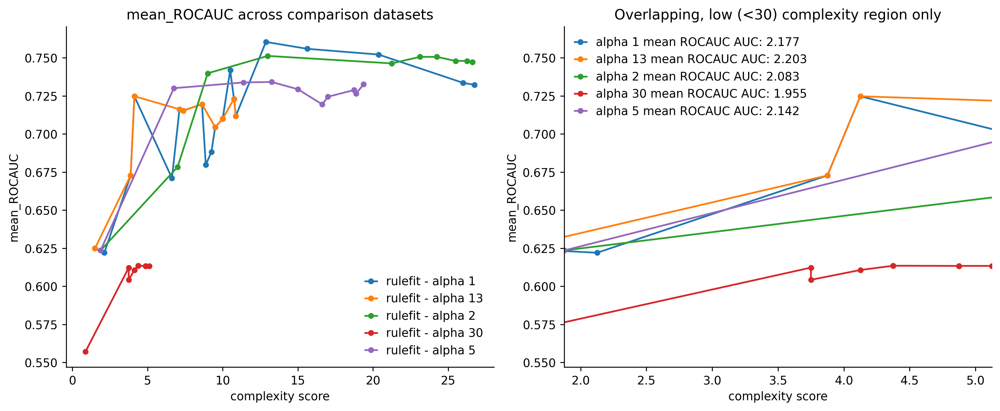

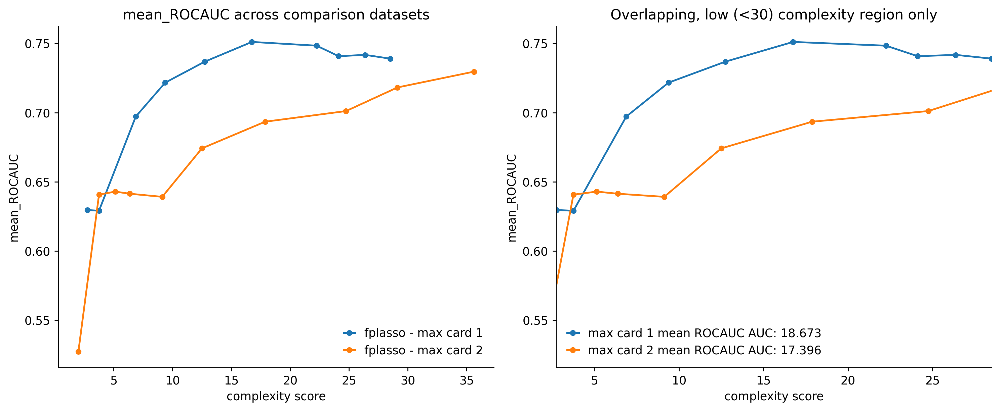

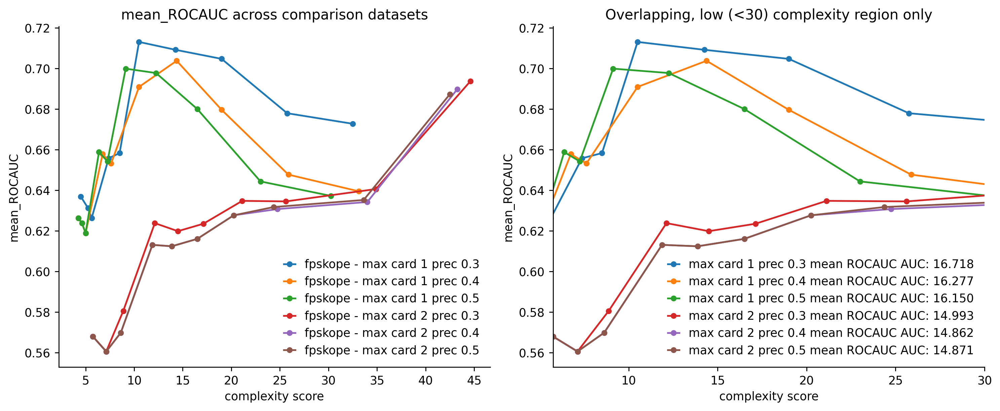

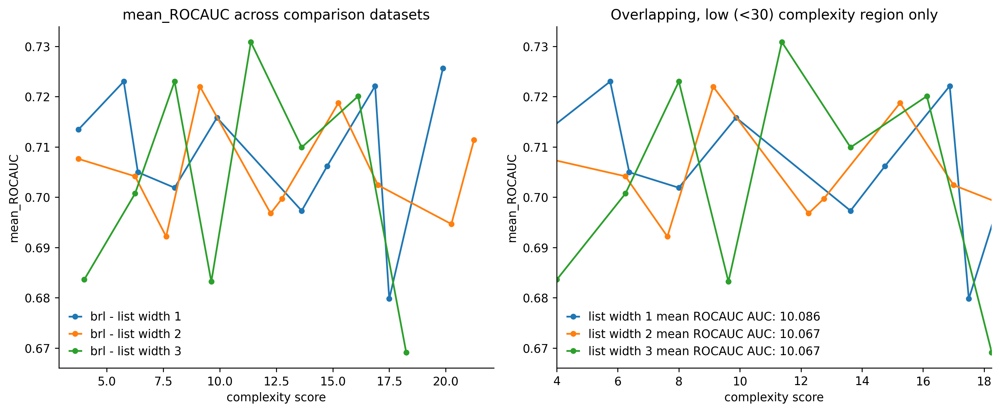

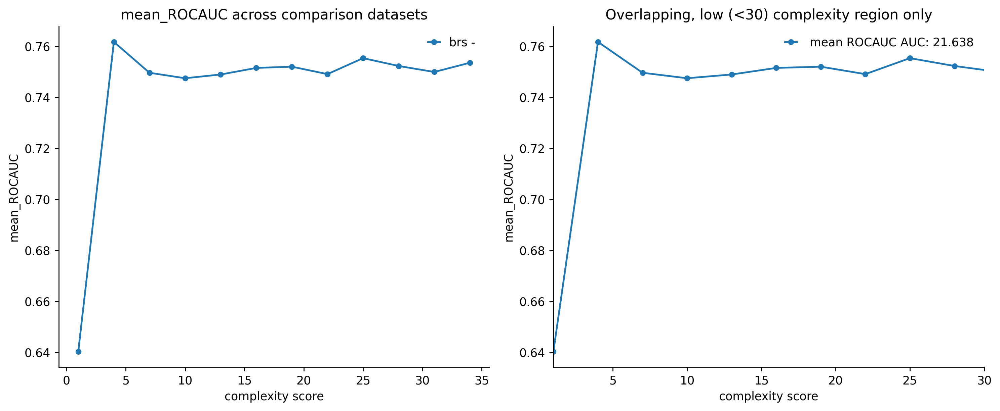

In [2]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, easy=True) for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

## cross validation

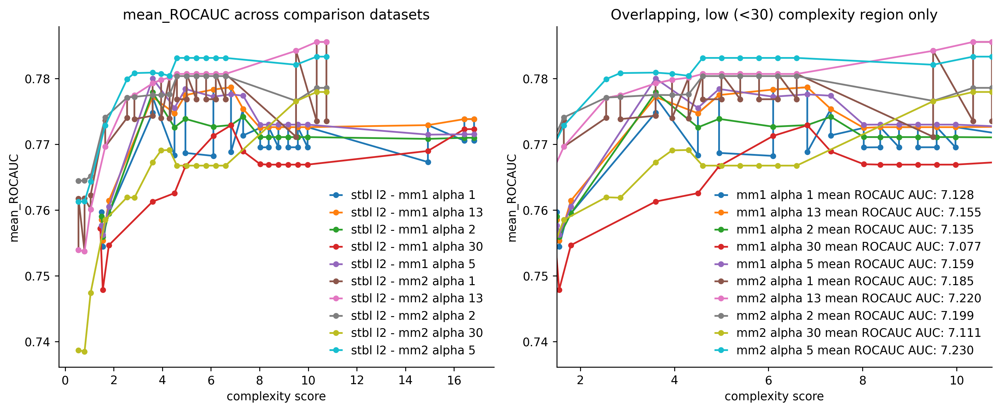

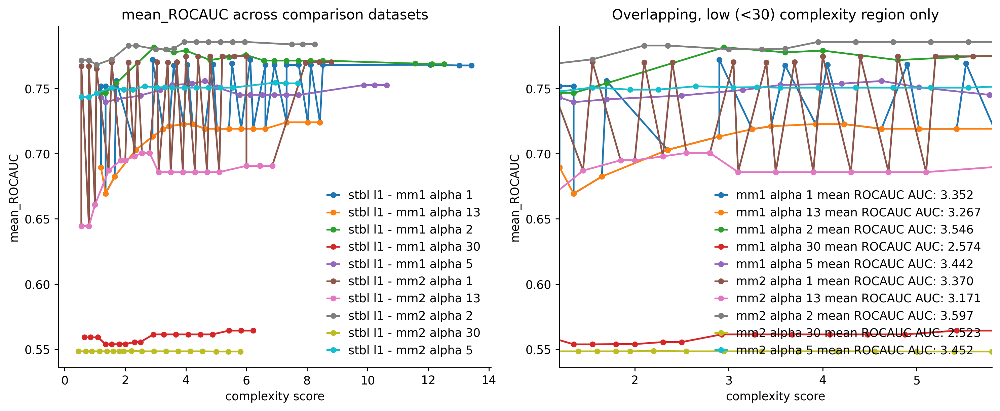

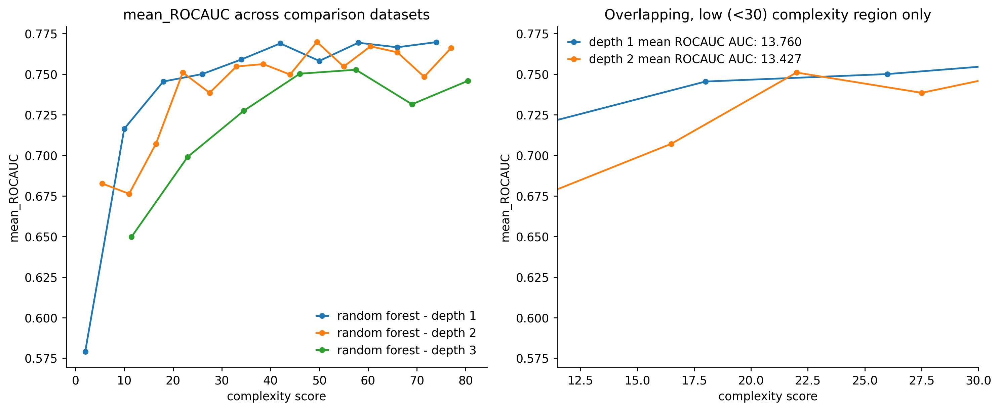

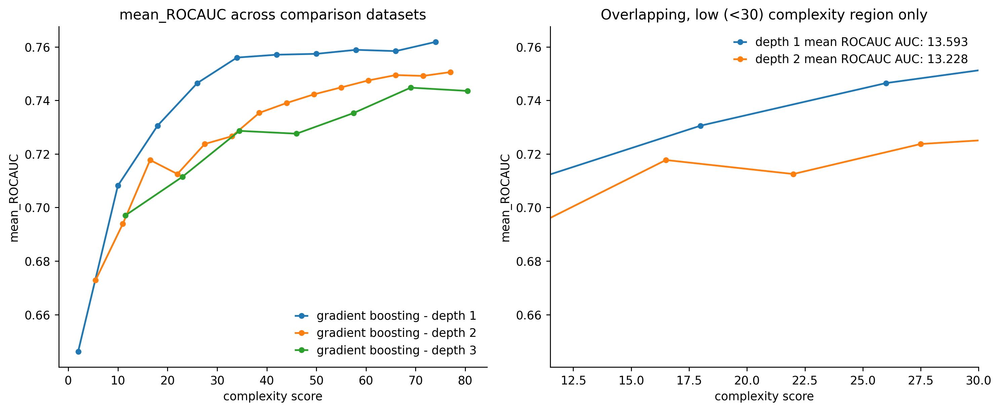

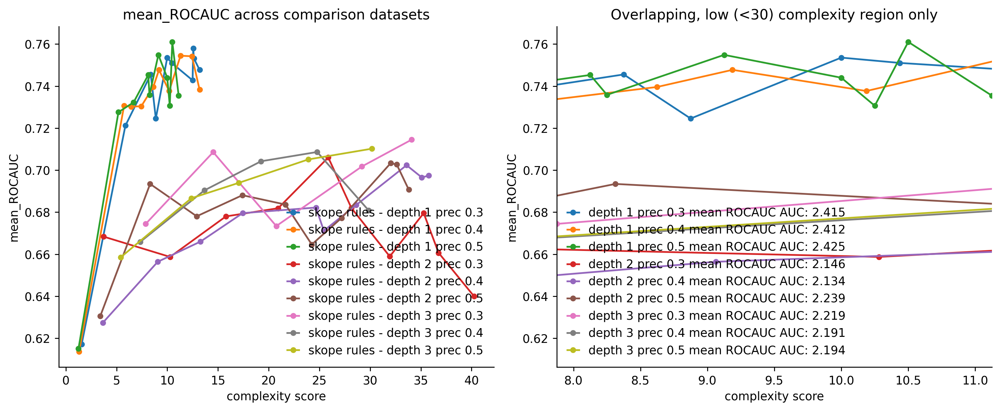

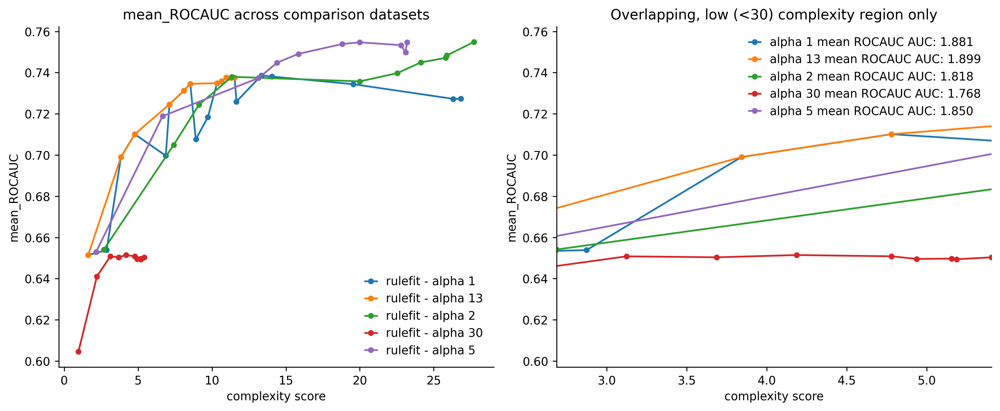

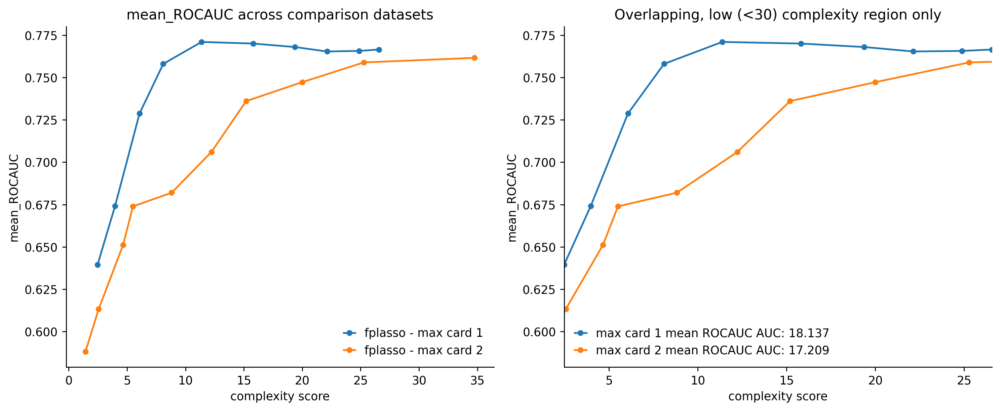

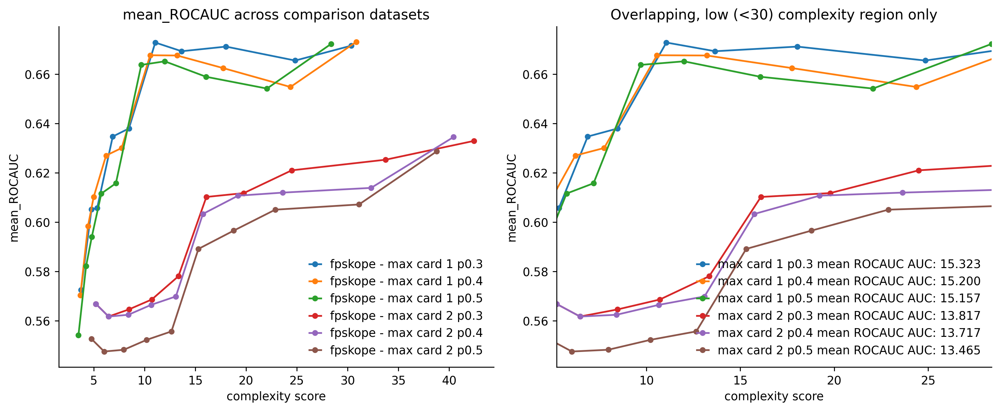

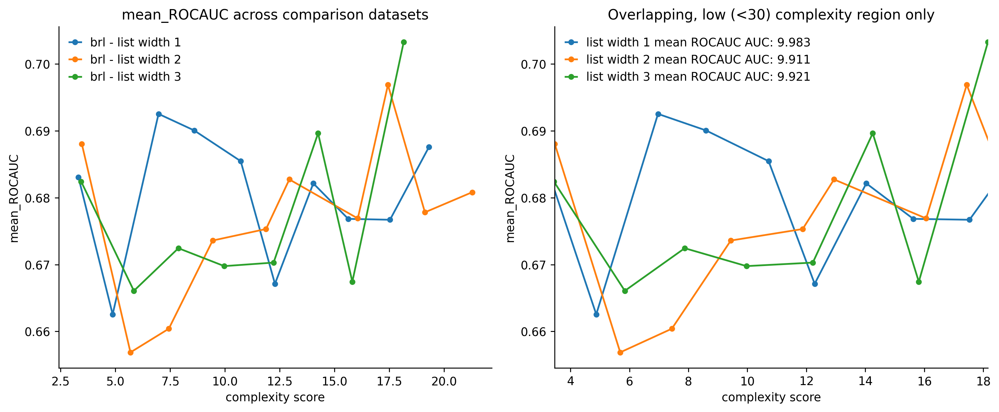

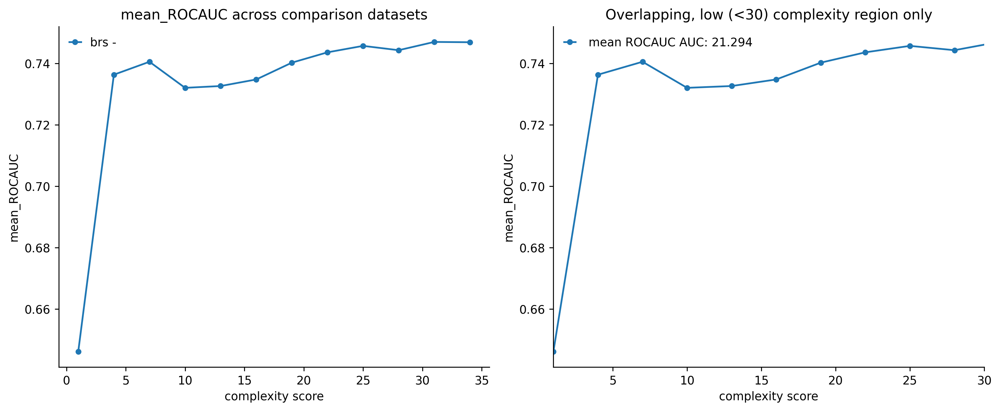

In [3]:
val_models = ['stbl_l2', 'stbl_l1', 'random_forest', 'gradient_boosting', 'skope_rules', 'rulefit', 'fplasso', 'fpskope', 'brl', 'brs']
val_results = [get_comparison_result(MODEL_COMPARISON_PATH, mname, prefix='cv', easy=True) for mname in val_models]
for result in val_results:
    viz.viz_comparison_val_average(result, metric='mean_ROCAUC')
    plt.show()

In [71]:
# np.concatenate((np.arange(2, 10), np.arange(10, 29, 2)))

array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 12, 14, 16, 18, 20, 22, 24, 26,
       28])

In [12]:
np.arange(1, 26, 3)

array([ 1,  4,  7, 10, 13, 16, 19, 22, 25])

In [81]:
# get_best_model_under_complexity(5, 
#                                 model_name='brl', 
#                                 model_cls=imodels.BayesianRuleListClassifier, 
#                                 curve_param=1,
#                                 metric='mean_ROCAUC',
#                                 easy=True).__str__()
#                                 #kwargs = {'include_linear': False, 'random_state': 0, 'max_rules': None},)

In [8]:
from slurmpy import Slurm
partition = 'high'
s = Slurm("compare_models", {"partition": partition})


# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 0 17')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 18 35')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 36 53')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 54 71')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 72 89')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 90 107')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 108 125')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 126 143')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 144 161')
# s.run('python experiments/compare_models.py --model stbl_l2 --ensemble --ignore_cache --cv --parallel_id 162 179')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 162 179')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 144 161')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 126 143')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 108 125')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 90 107')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 72 89')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 54 71')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 36 53')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 18 35')
s.run('python experiments/compare_models.py --model stbl_l1 --ensemble --ignore_cache --cv --parallel_id 0 17')

b'Submitted batch job 937081'
b'Submitted batch job 937082'
b'Submitted batch job 937083'
b'Submitted batch job 937084'
b'Submitted batch job 937085'
b'Submitted batch job 937086'
b'Submitted batch job 937087'
b'Submitted batch job 937088'
b'Submitted batch job 937089'
b'Submitted batch job 937090'


937090

In [29]:
s.run('python experiments/compare_models.py --test --ignore_cache --low_data')

b'Submitted batch job 937108'


937108

In [ ]:
s.run('python experiments/compare_models.py --test --ensemble --ignore_cache')

In [21]:
!python experiments/compare_models.py --test --ensemble --ignore_cache --datasets easy

/accounts/projects/binyu/keyan3/imodels/experiments/util.py:90: UserWarning: fplasso skipped for complexity limit 2
  warnings.warn(f'{model_name} skipped for complexity limit {c}')
False
18
18
18
  0%|                                                     | 0/4 [00:06<?, ?it/s]
Traceback (most recent call last):
  File "/accounts/projects/binyu/keyan3/imodels/experiments/compare_models.py", line 350, in <module>
    main()
  File "/accounts/projects/binyu/keyan3/imodels/experiments/compare_models.py", line 335, in main
    run_comparison(path,
  File "/accounts/projects/binyu/keyan3/imodels/experiments/compare_models.py", line 206, in run_comparison
    mean_results, rules = compare_estimators(estimators=estimators,
  File "/accounts/projects/binyu/keyan3/imodels/experiments/compare_models.py", line 154, in compare_estimators
    est.fit(X_fit, y_fit, feature_names=feat_names)
  File "/accounts/projects/binyu/keyan3/imodels/experiments/models/stablelinear.py", line 48, in fit
    super(